In [1]:
freq = 15

In [2]:
paciente='paciente4'

In [3]:
import codigo
from codigo import utils
from codigo import model_LSTM
from codigo import model_utils
from cg_ega.cg_ega import CG_EGA

In [4]:
import pandas as pd
import numpy as np
pd.set_option('mode.chained_assignment',None)
import matplotlib.pyplot as plt
import seaborn as sns
import math

%matplotlib inline

In [5]:
import tensorflow as tf
from tensorflow import keras

In [6]:
with open('dataset/generado/'+paciente+'/array_Xtest.npy', 'rb') as f:
    array_Xtest = np.load(f)

In [7]:
len(array_Xtest)

6201

In [8]:
with open('dataset/generado/'+paciente+'/array_Ytest.npy', 'rb') as f:
    array_Ytest = np.load(f)

In [9]:
len(array_Ytest)

6201

# Pruebas Vanilla LSTM con dropout

In [10]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_dropout.h5')

In [11]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [12]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 6ms/step


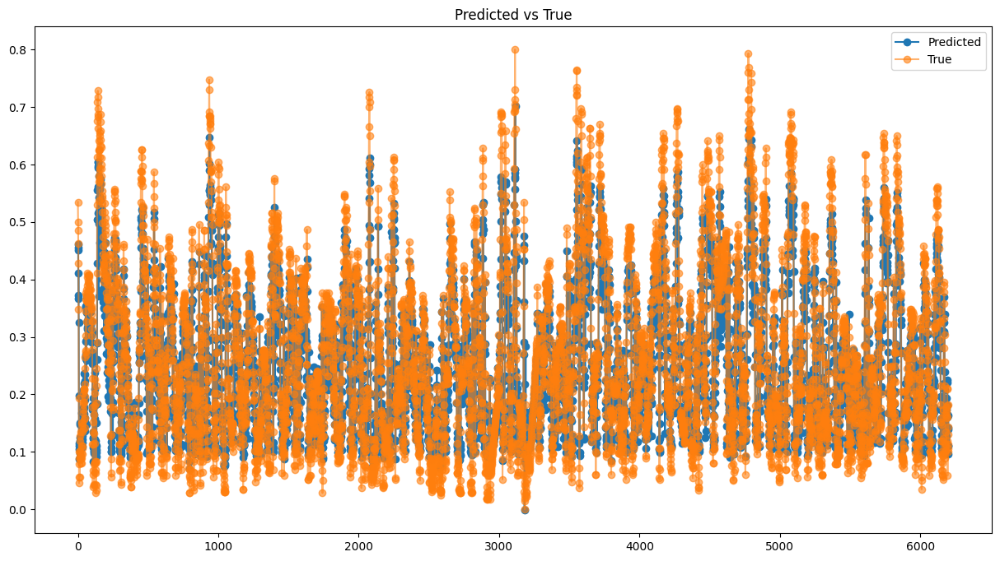

In [13]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [14]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.0467451500287884,
 'mse': 0.06131498381748587,
 'rmse': 0.0037595272405385534}

In [15]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,249.338501
1,252.456085
2,247.408264
3,211.492355
4,229.088715
...,...
6196,90.682358
6197,105.536804
6198,104.232750
6199,90.705246


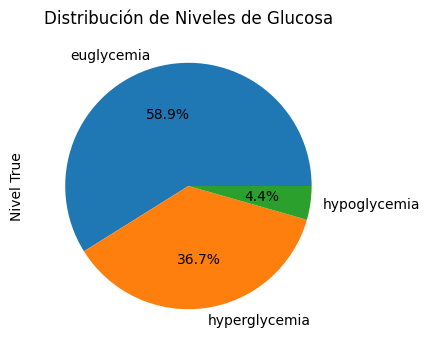

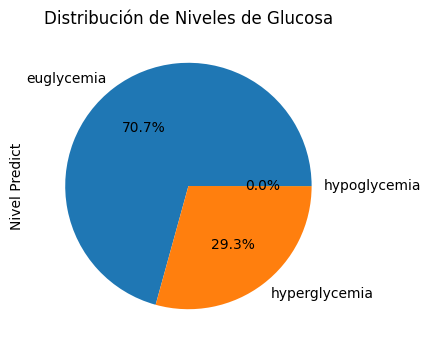

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,249.338501,hyperglycemia
1,270.0,hyperglycemia,252.456085,hyperglycemia
2,263.0,hyperglycemia,247.408264,hyperglycemia
3,253.0,hyperglycemia,211.492355,hyperglycemia
4,237.0,hyperglycemia,229.088715,hyperglycemia


In [16]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


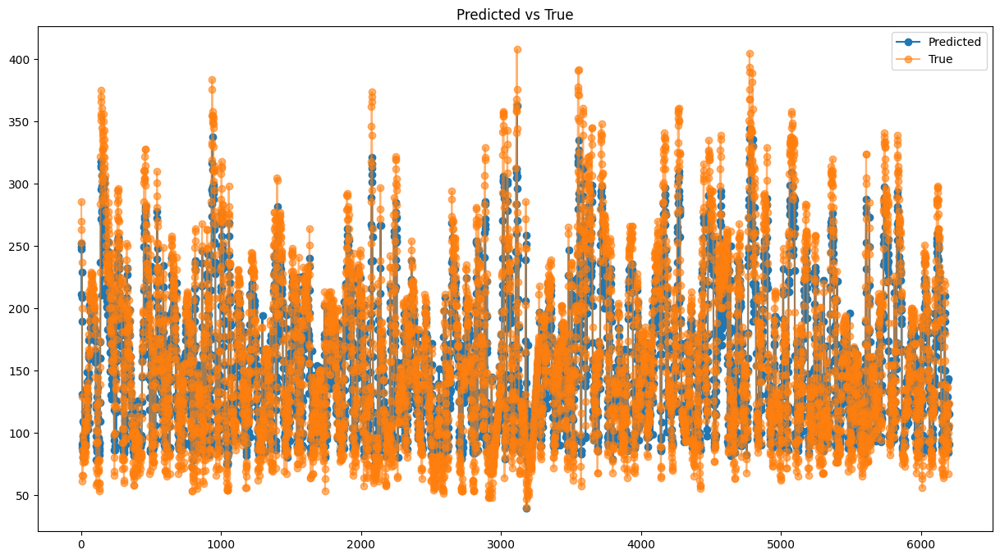

{'mae': 21.502768800099094,
 'mse': 28.204892832938373,
 'rmse': 795.5159797175384}

In [17]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [18]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [19]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,249.338501
2023-01-01 00:15:00,270.0,252.456085
2023-01-01 00:30:00,263.0,247.408264
2023-01-01 00:45:00,253.0,211.492355
2023-01-01 01:00:00,237.0,229.088715
...,...,...
2023-03-06 13:00:00,100.0,90.682358
2023-03-06 13:15:00,89.0,105.536804
2023-03-06 13:30:00,92.0,104.232750
2023-03-06 13:45:00,106.0,90.705246


AP, BE, EP: (0.8248387096774193, 0.09693548387096775, 0.07822580645161291)


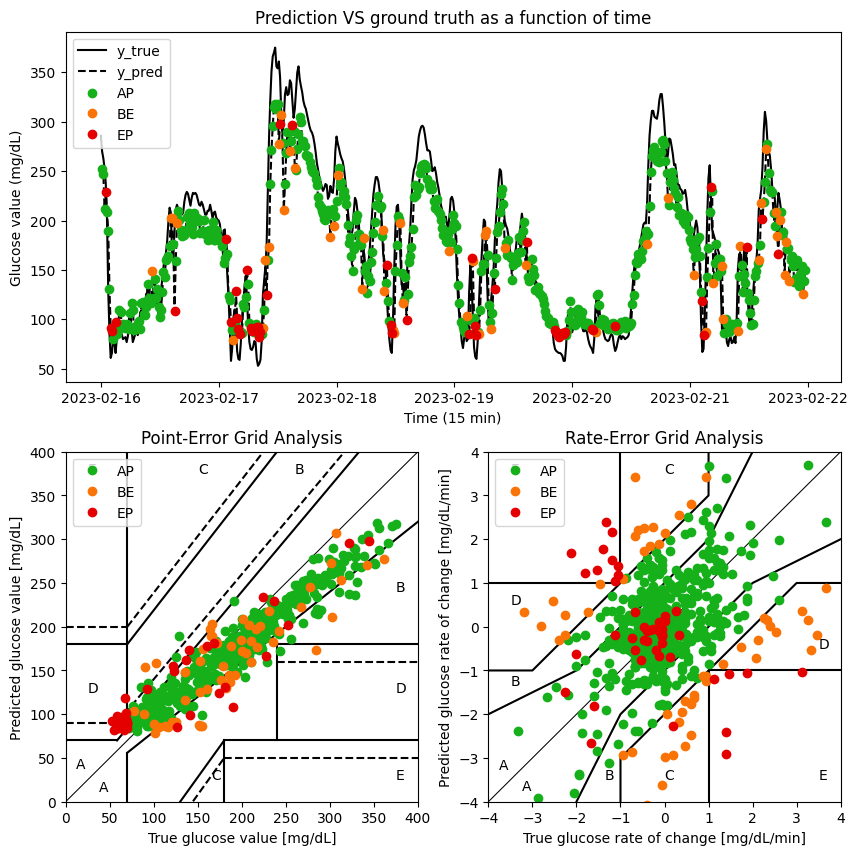

In [20]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [21]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,286.0,249.338501,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,270.0,252.456085,-1.066667,0.207839,AP,A,B
2,2023-02-16 00:30:00,263.0,247.408264,-0.466667,-0.336521,AP,A,A
3,2023-02-16 00:45:00,253.0,211.492355,-0.666667,-2.394394,AP,A,B
4,2023-02-16 01:00:00,237.0,229.088715,-1.066667,1.173091,EP,A,uE
...,...,...,...,...,...,...,...,...
6196,2023-04-21 13:00:00,100.0,90.682358,0.933333,0.435226,AP,A,A
6197,2023-04-21 13:15:00,89.0,105.536804,-0.733333,0.990296,AP,A,B
6198,2023-04-21 13:30:00,92.0,104.232750,0.200000,-0.086937,AP,A,A
6199,2023-04-21 13:45:00,106.0,90.705246,0.933333,-0.901834,AP,A,B


# Predicción a 60 min del conjunto de pruebas generales

In [22]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [23]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 26ms/step


,Glucose level Predict,Glucose level True
0,0.455084,0.534783
1,0.461861,0.500000


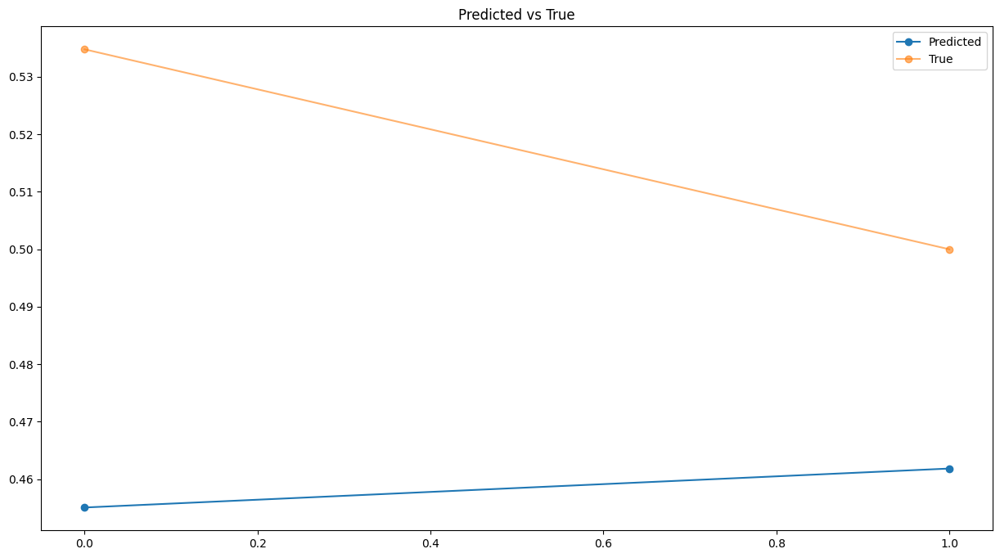

{'mae': 0.05891887364180193,
 'mse': 0.062475914511120854,
 'rmse': 0.0039032398940008813}

In [24]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [25]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,249.338531,286.0
1,252.456085,270.0


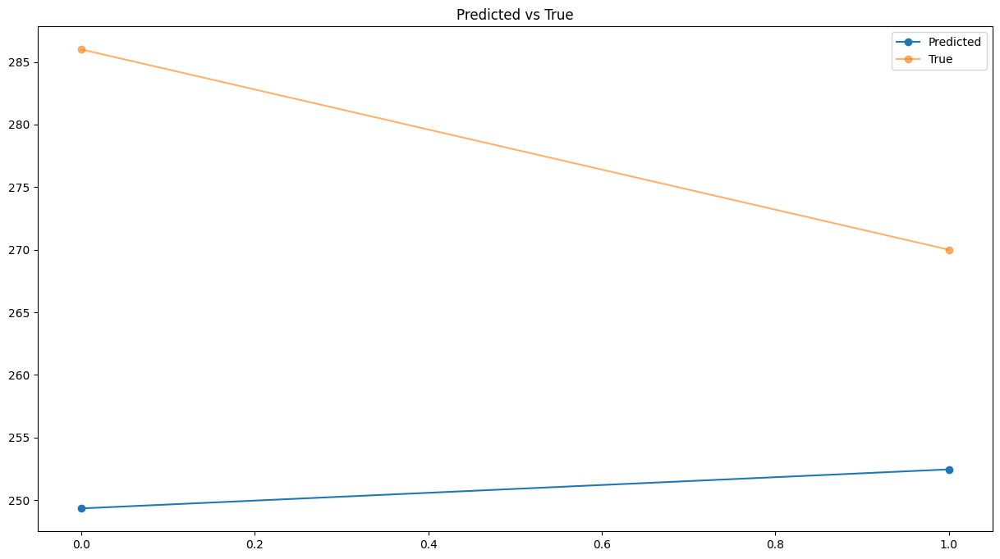

{'mae': 27.102691650390597,
 'mse': 28.738930210931613,
 'rmse': 825.9261096687977}

In [26]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Vanilla LSTM sin dropout

In [27]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_NO_dropout.h5')

In [28]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [29]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 4ms/step


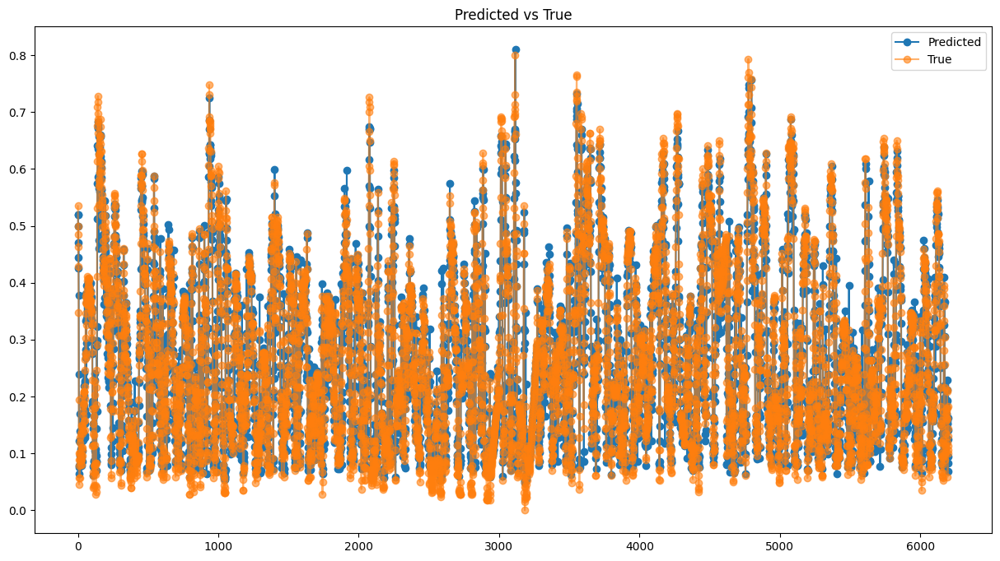

In [30]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [31]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03574429846777463,
 'mse': 0.05045417835105752,
 'rmse': 0.0025456241130803214}

In [32]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,279.179413
1,279.053467
2,269.502930
3,244.615463
4,256.373383
...,...
6196,77.860069
6197,114.545006
6198,97.269867
6199,83.236702


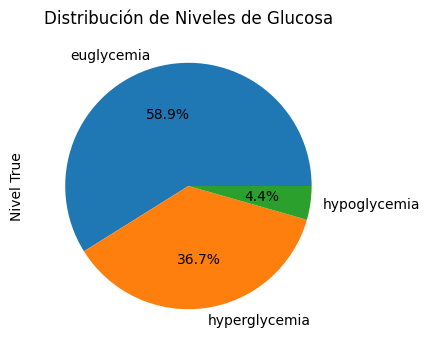

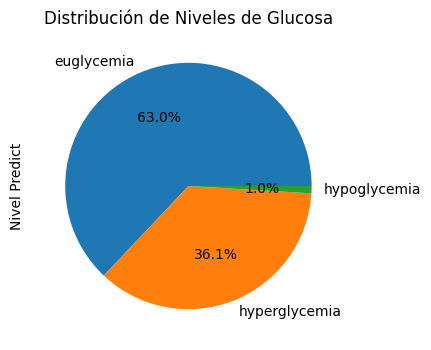

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,279.179413,hyperglycemia
1,270.0,hyperglycemia,279.053467,hyperglycemia
2,263.0,hyperglycemia,269.502930,hyperglycemia
3,253.0,hyperglycemia,244.615463,hyperglycemia
4,237.0,hyperglycemia,256.373383,hyperglycemia


In [33]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


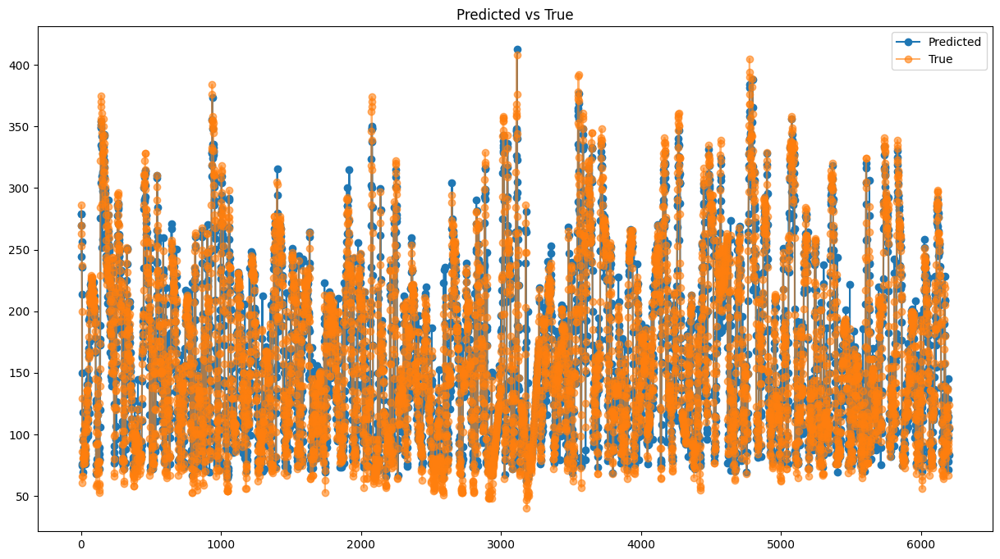

{'mae': 16.44237753343631,
 'mse': 23.208922249353748,
 'rmse': 538.6540719765474}

In [34]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [35]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [36]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,279.179413
2023-01-01 00:15:00,270.0,279.053467
2023-01-01 00:30:00,263.0,269.502930
2023-01-01 00:45:00,253.0,244.615463
2023-01-01 01:00:00,237.0,256.373383
...,...,...
2023-03-06 13:00:00,100.0,77.860069
2023-03-06 13:15:00,89.0,114.545006
2023-03-06 13:30:00,92.0,97.269867
2023-03-06 13:45:00,106.0,83.236702


AP, BE, EP: (0.8280645161290323, 0.11193548387096774, 0.06)


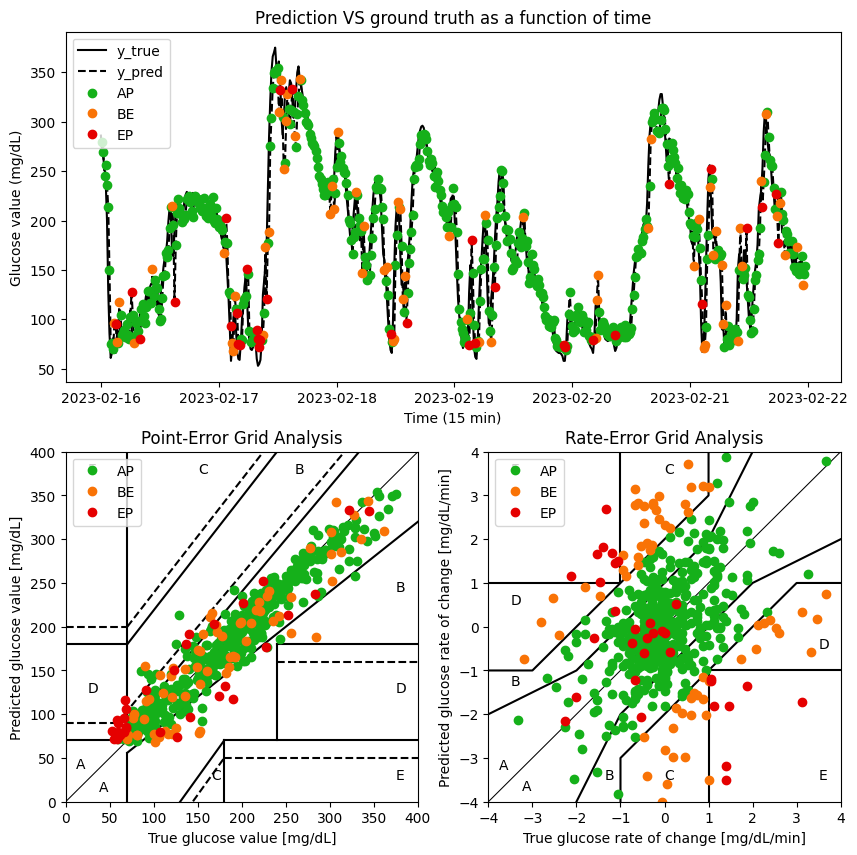

In [37]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [38]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,286.0,279.179413,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,270.0,279.053467,-1.066667,-0.008396,AP,A,B
2,2023-02-16 00:30:00,263.0,269.502930,-0.466667,-0.636702,AP,A,A
3,2023-02-16 00:45:00,253.0,244.615463,-0.666667,-1.659164,AP,A,A
4,2023-02-16 01:00:00,237.0,256.373383,-1.066667,0.783861,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-21 13:00:00,100.0,77.860069,0.933333,0.412982,AP,B,A
6197,2023-04-21 13:15:00,89.0,114.545006,-0.733333,2.445662,BE,B,uC
6198,2023-04-21 13:30:00,92.0,97.269867,0.200000,-1.151676,AP,A,B
6199,2023-04-21 13:45:00,106.0,83.236702,0.933333,-0.935544,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [39]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [40]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 22ms/step


,Glucose level Predict,Glucose level True
0,0.519955,0.534783
1,0.519682,0.500000


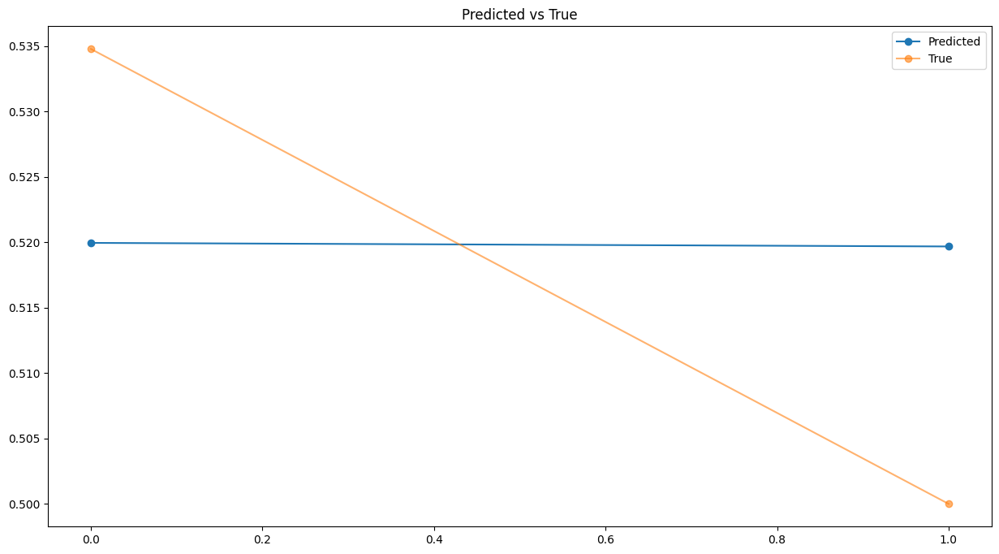

{'mae': 0.017254422281099413,
 'mse': 0.01742428934317091,
 'rmse': 0.00030360585911453936}

In [41]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [42]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,279.179413,286.0
1,279.053497,270.0


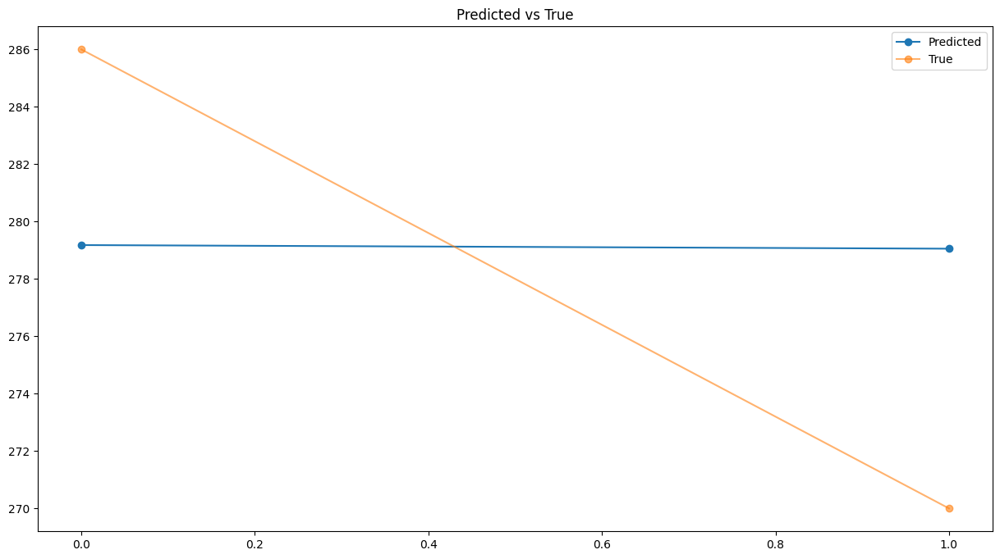

{'mae': 7.937042236328153, 'mse': 8.015180060530653, 'rmse': 64.24311140272818}

In [43]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM con dropout

In [44]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_dropout.h5')

In [45]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [46]:
len(array_Ytest)

6201

194/194 [==============================] - 2s 7ms/step


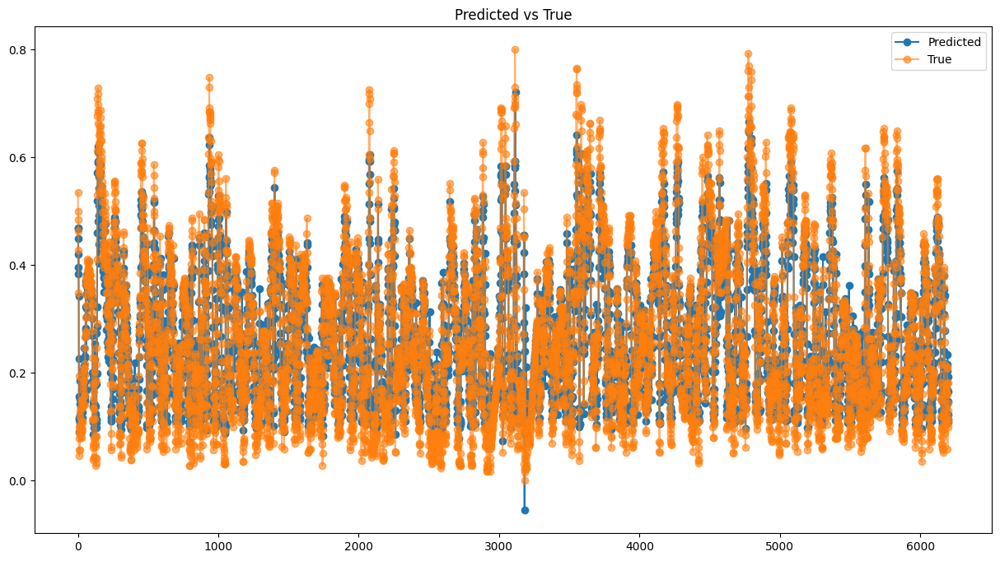

In [47]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [48]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04303221803171593,
 'mse': 0.056763325242815986,
 'rmse': 0.0032220750926217102}

In [49]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,254.851990
1,255.805862
2,246.805237
3,221.823456
4,233.363571
...,...
6196,92.356094
6197,128.612579
6198,107.471390
6199,96.350632


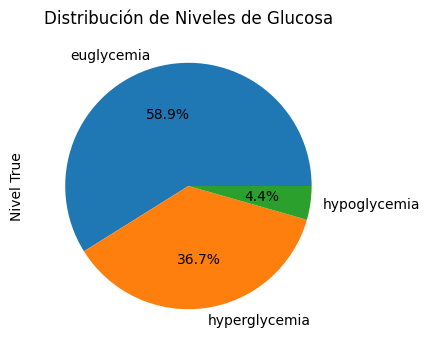

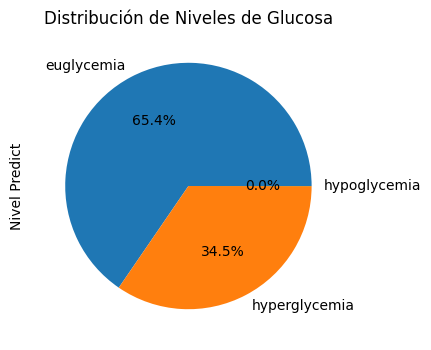

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,254.851990,hyperglycemia
1,270.0,hyperglycemia,255.805862,hyperglycemia
2,263.0,hyperglycemia,246.805237,hyperglycemia
3,253.0,hyperglycemia,221.823456,hyperglycemia
4,237.0,hyperglycemia,233.363571,hyperglycemia


In [50]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


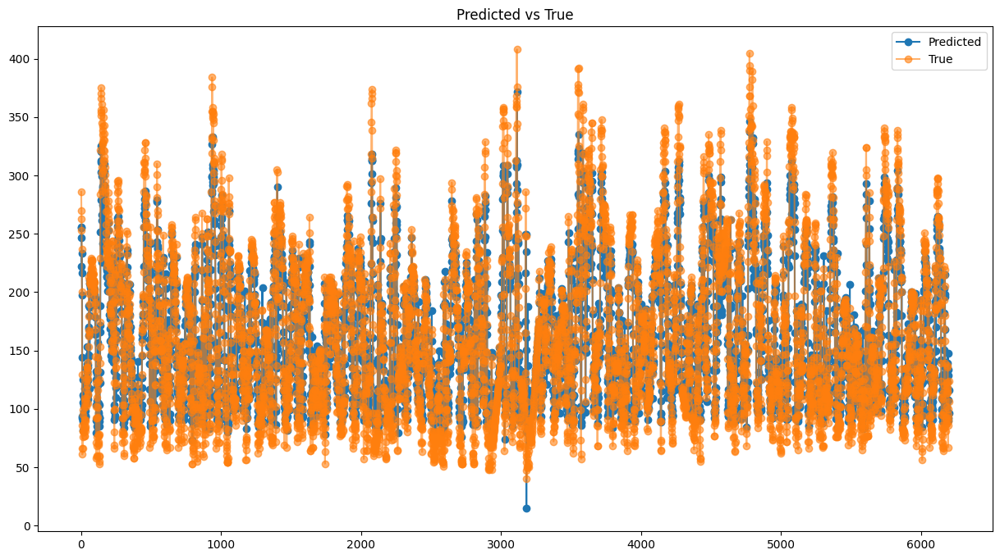

{'mae': 19.794820423232892,
 'mse': 26.111130099775067,
 'rmse': 681.7911150873795}

In [51]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [52]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [53]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,254.851990
2023-01-01 00:15:00,270.0,255.805862
2023-01-01 00:30:00,263.0,246.805237
2023-01-01 00:45:00,253.0,221.823456
2023-01-01 01:00:00,237.0,233.363571
...,...,...
2023-03-06 13:00:00,100.0,92.356094
2023-03-06 13:15:00,89.0,128.612579
2023-03-06 13:30:00,92.0,107.471390
2023-03-06 13:45:00,106.0,96.350632


AP, BE, EP: (0.8333870967741935, 0.09032258064516129, 0.07629032258064516)


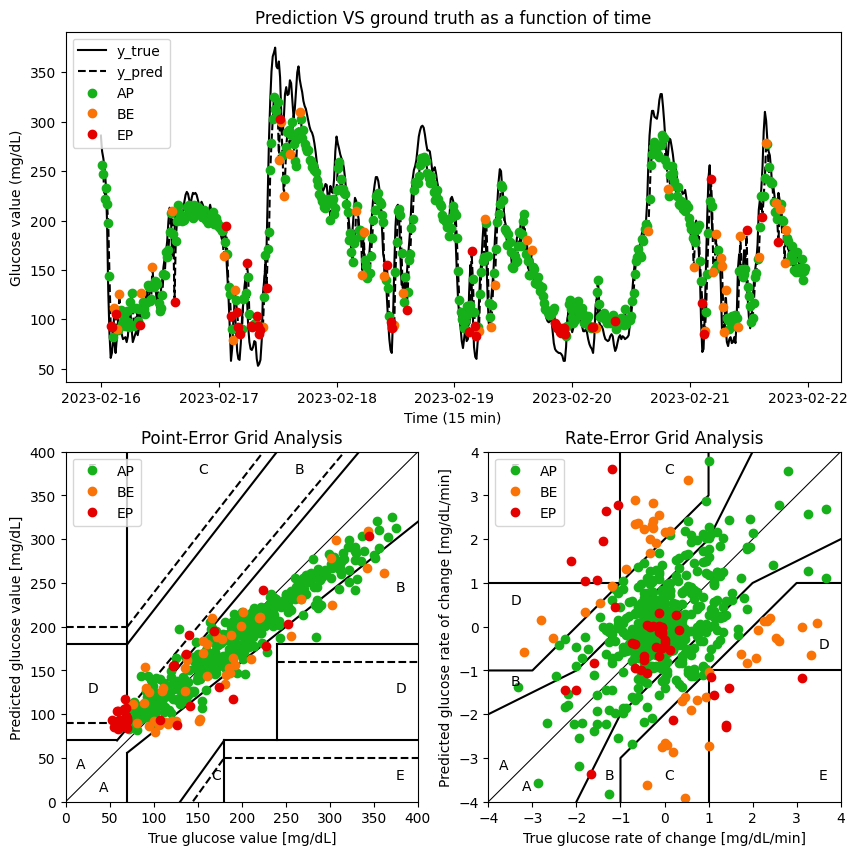

In [54]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [55]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,286.0,254.851990,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,270.0,255.805862,-1.066667,0.063592,AP,A,B
2,2023-02-16 00:30:00,263.0,246.805237,-0.466667,-0.600042,AP,A,A
3,2023-02-16 00:45:00,253.0,221.823456,-0.666667,-1.665452,AP,A,A
4,2023-02-16 01:00:00,237.0,233.363571,-1.066667,0.769341,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-21 13:00:00,100.0,92.356094,0.933333,0.179996,AP,A,A
6197,2023-04-21 13:15:00,89.0,128.612579,-0.733333,2.417099,BE,B,uC
6198,2023-04-21 13:30:00,92.0,107.471390,0.200000,-1.409413,AP,A,B
6199,2023-04-21 13:45:00,106.0,96.350632,0.933333,-0.741384,AP,A,B


# Predicción a 60 min del conjunto de pruebas generales

In [56]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [57]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 24ms/step


,Glucose level Predict,Glucose level True
0,0.467070,0.534783
1,0.469143,0.500000


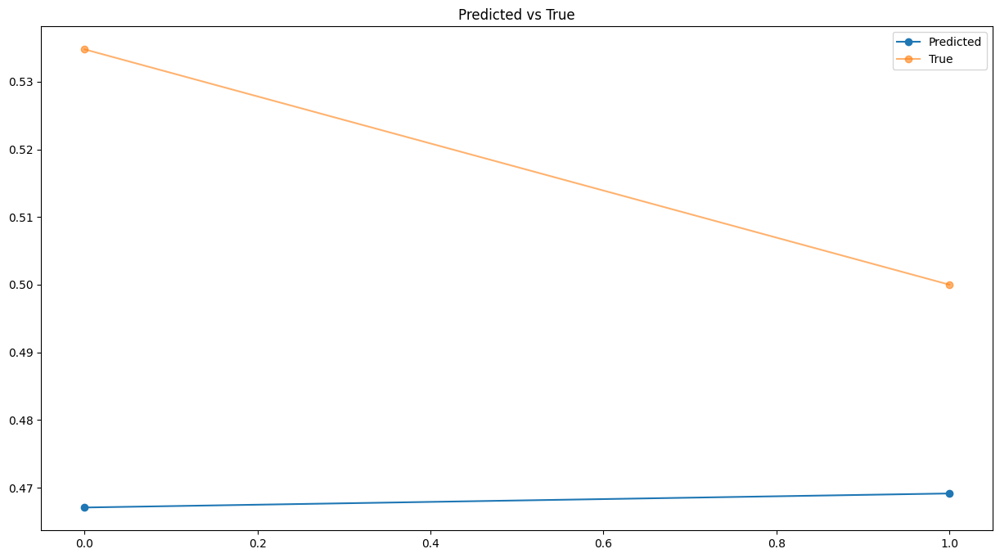

{'mae': 0.04928490040094957,
 'mse': 0.05261746693596034,
 'rmse': 0.0027685978267568798}

In [58]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [59]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,254.851990,286.0
1,255.805893,270.0


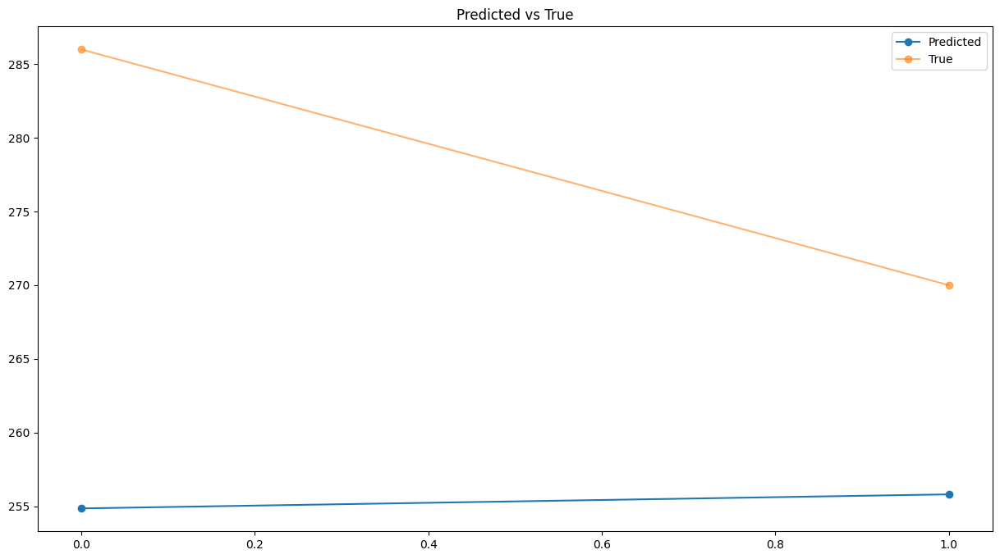

{'mae': 22.671058654785128,
 'mse': 24.204041169659043,
 'rmse': 585.8356089425498}

In [60]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM sin dropout

In [61]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_NO_dropout.h5')

In [62]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [63]:
len(array_Ytest)

6201

194/194 [==============================] - 2s 8ms/step


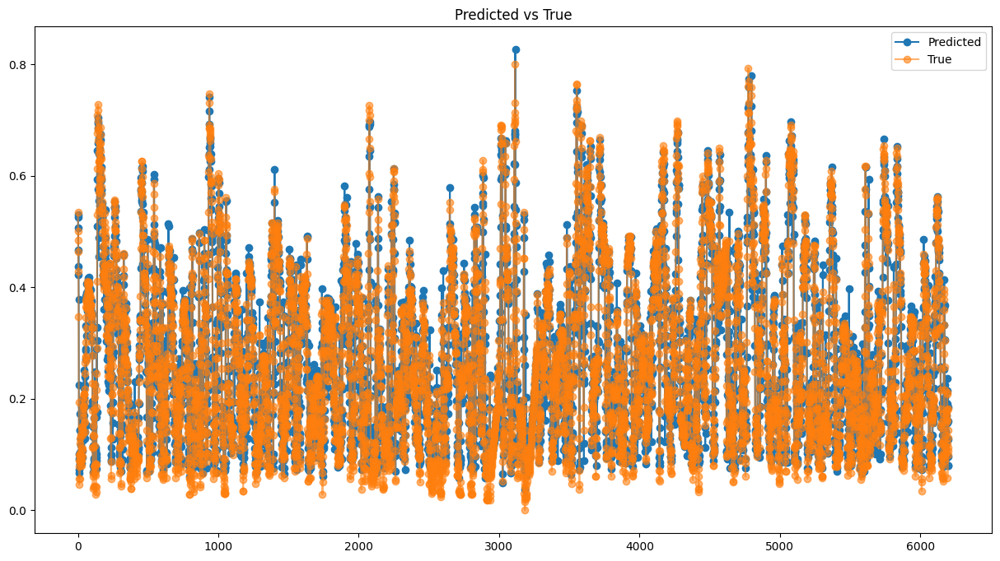

In [64]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [65]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03542202547730093,
 'mse': 0.049707043965245314,
 'rmse': 0.002470790219762831}

In [66]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,281.724548
1,283.590424
2,273.133850
3,241.413757
4,254.909302
...,...
6196,76.635124
6197,124.765434
6198,98.806137
6199,84.085213


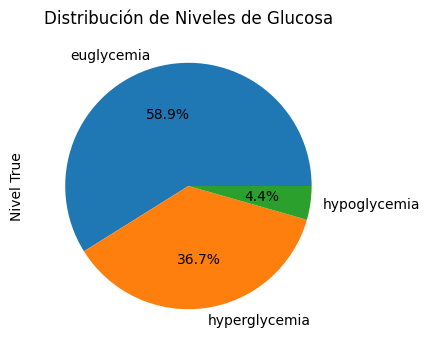

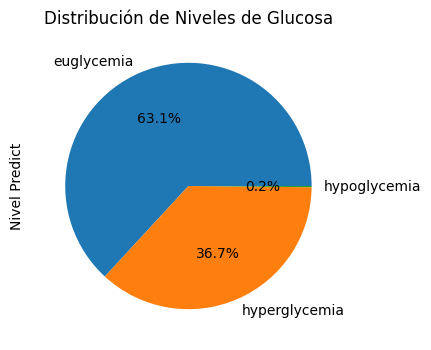

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,281.724548,hyperglycemia
1,270.0,hyperglycemia,283.590424,hyperglycemia
2,263.0,hyperglycemia,273.133850,hyperglycemia
3,253.0,hyperglycemia,241.413757,hyperglycemia
4,237.0,hyperglycemia,254.909302,hyperglycemia


In [67]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


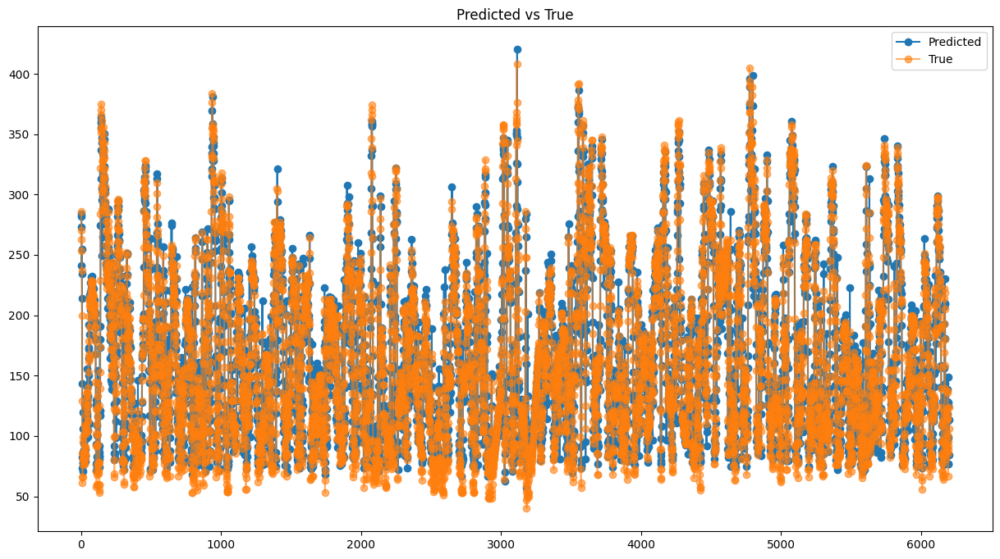

{'mae': 16.2941319705184, 'mse': 22.865240357146092, 'rmse': 522.8192165900624}

In [68]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [69]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [70]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,281.724548
2023-01-01 00:15:00,270.0,283.590424
2023-01-01 00:30:00,263.0,273.133850
2023-01-01 00:45:00,253.0,241.413757
2023-01-01 01:00:00,237.0,254.909302
...,...,...
2023-03-06 13:00:00,100.0,76.635124
2023-03-06 13:15:00,89.0,124.765434
2023-03-06 13:30:00,92.0,98.806137
2023-03-06 13:45:00,106.0,84.085213


AP, BE, EP: (0.8132258064516129, 0.11661290322580645, 0.07016129032258064)


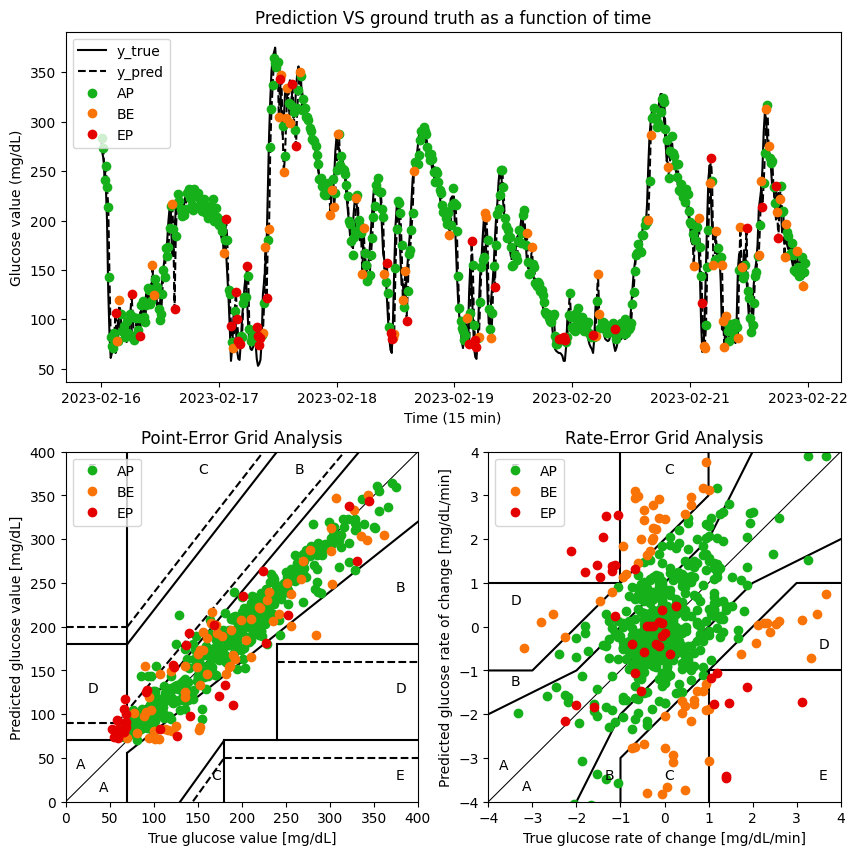

In [71]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [72]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,286.0,281.724548,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,270.0,283.590424,-1.066667,0.124392,AP,A,B
2,2023-02-16 00:30:00,263.0,273.133850,-0.466667,-0.697105,AP,A,A
3,2023-02-16 00:45:00,253.0,241.413757,-0.666667,-2.114673,AP,A,B
4,2023-02-16 01:00:00,237.0,254.909302,-1.066667,0.899703,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-21 13:00:00,100.0,76.635124,0.933333,0.007134,AP,B,A
6197,2023-04-21 13:15:00,89.0,124.765434,-0.733333,3.208687,BE,B,uC
6198,2023-04-21 13:30:00,92.0,98.806137,0.200000,-1.730620,AP,A,B
6199,2023-04-21 13:45:00,106.0,84.085213,0.933333,-0.981395,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [73]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [74]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 24ms/step


,Glucose level Predict,Glucose level True
0,0.525488,0.534783
1,0.529544,0.500000


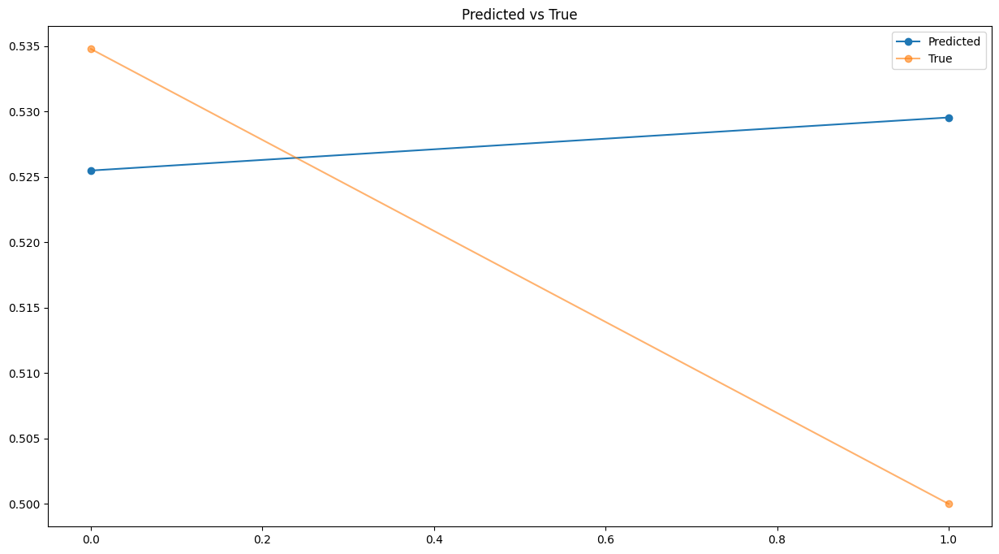

{'mae': 0.01941938218863115,
 'mse': 0.021900398360363064,
 'rmse': 0.0004796274483425932}

In [75]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [76]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,281.724548,286.0
1,283.590393,270.0


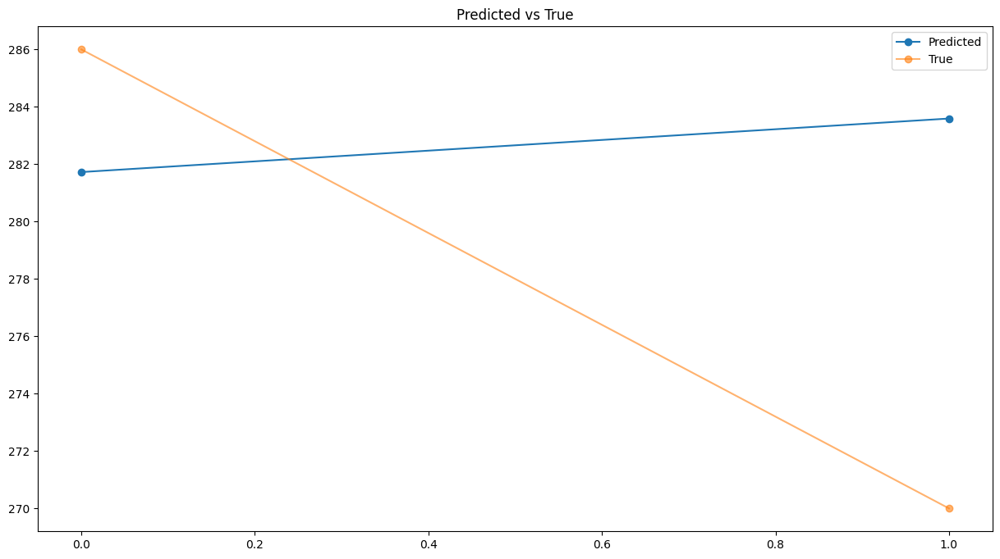

{'mae': 8.932922363281278,
 'mse': 10.07418161931175,
 'rmse': 101.48913529887872}

In [77]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM con dropout

In [78]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_dropout.h5')

In [79]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [80]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 4ms/step


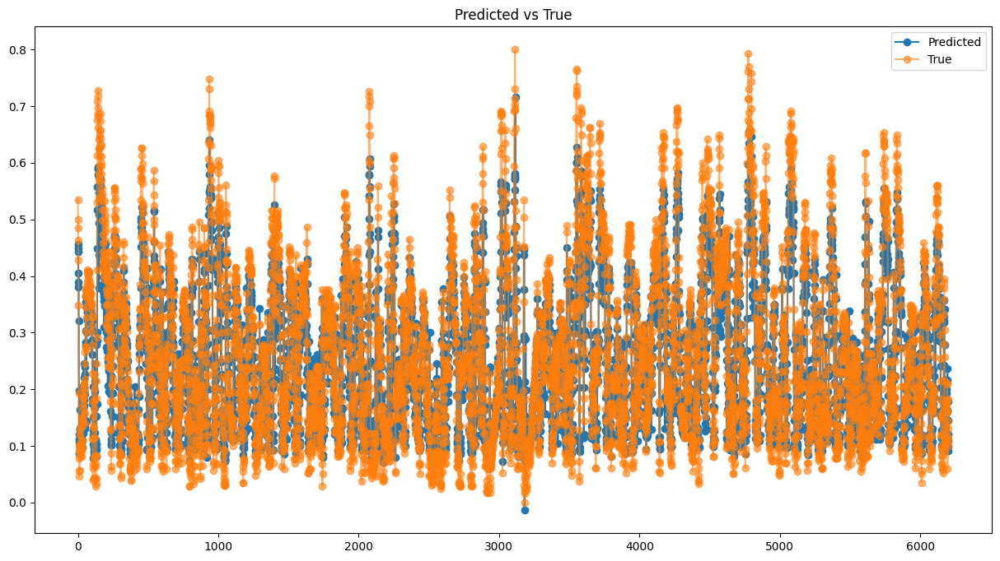

In [81]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [82]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.044656548156029444,
 'mse': 0.05953740424438804,
 'rmse': 0.003544702504159675}

In [83]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,246.086517
1,249.579071
2,243.579376
3,215.318100
4,226.422745
...,...
6196,85.333702
6197,122.320961
6198,95.457397
6199,90.162575


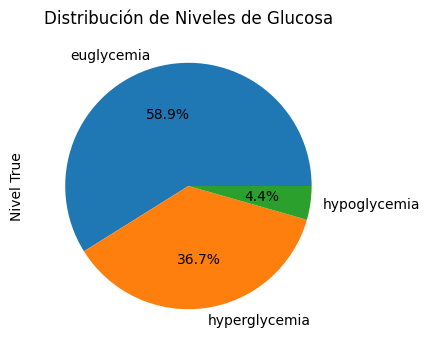

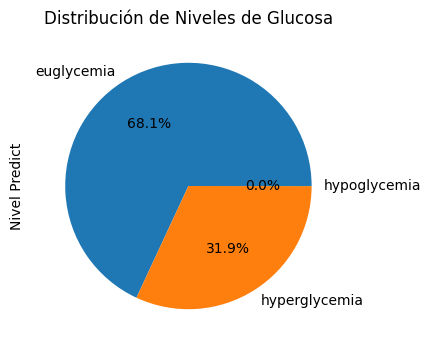

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,246.086517,hyperglycemia
1,270.0,hyperglycemia,249.579071,hyperglycemia
2,263.0,hyperglycemia,243.579376,hyperglycemia
3,253.0,hyperglycemia,215.318100,hyperglycemia
4,237.0,hyperglycemia,226.422745,hyperglycemia


In [84]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


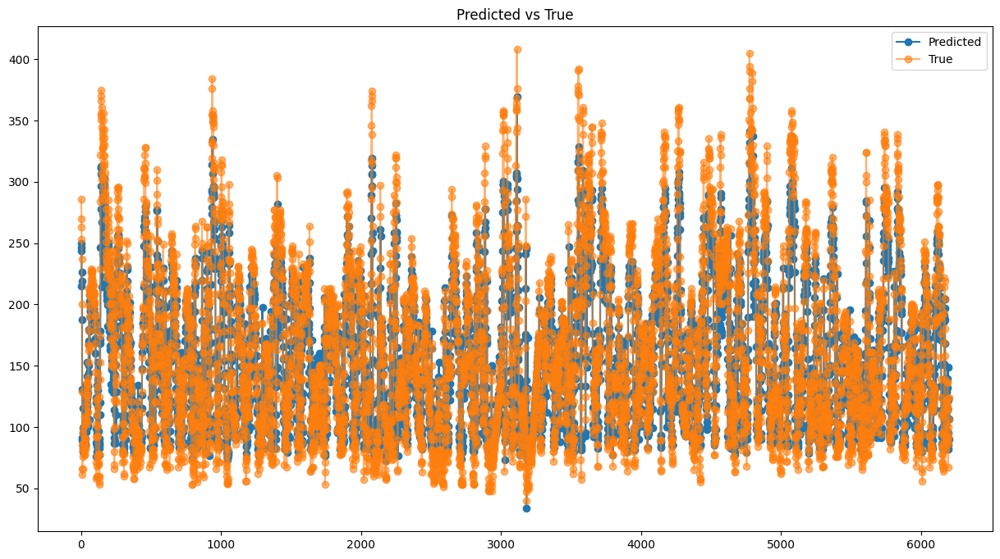

{'mae': 20.54201227861484,
 'mse': 27.387206646438873,
 'rmse': 750.0590878947456}

In [85]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [86]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [87]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,246.086517
2023-01-01 00:15:00,270.0,249.579071
2023-01-01 00:30:00,263.0,243.579376
2023-01-01 00:45:00,253.0,215.318100
2023-01-01 01:00:00,237.0,226.422745
...,...,...
2023-03-06 13:00:00,100.0,85.333702
2023-03-06 13:15:00,89.0,122.320961
2023-03-06 13:30:00,92.0,95.457397
2023-03-06 13:45:00,106.0,90.162575


AP, BE, EP: (0.8216129032258065, 0.10225806451612904, 0.07612903225806451)


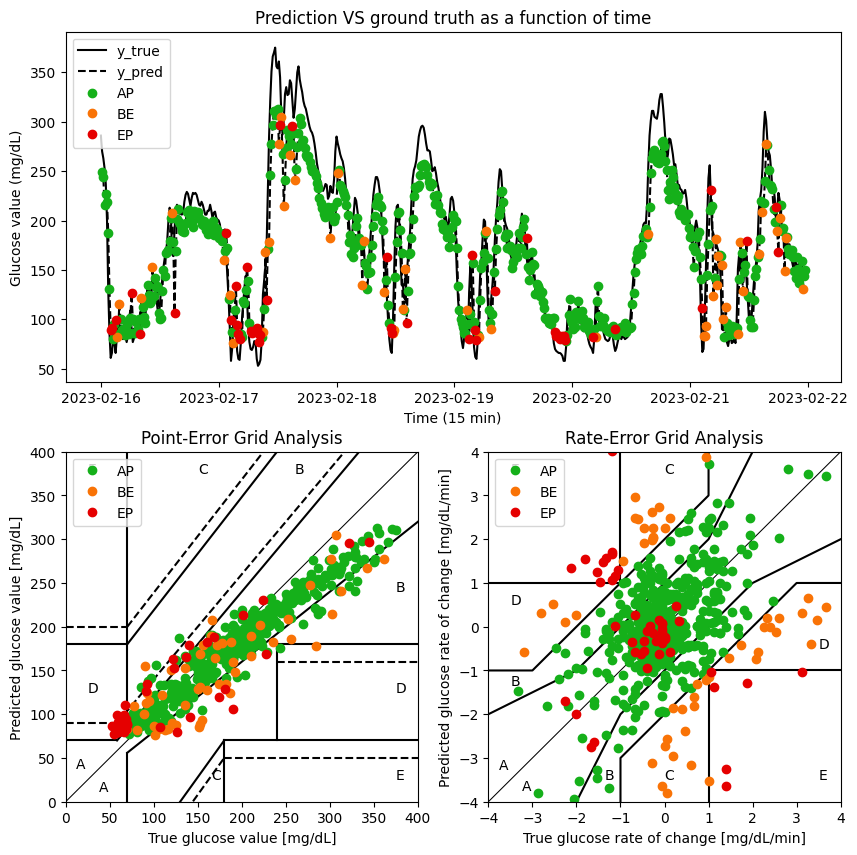

In [88]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [89]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,286.0,246.086517,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,270.0,249.579071,-1.066667,0.232837,AP,A,B
2,2023-02-16 00:30:00,263.0,243.579376,-0.466667,-0.399980,AP,A,A
3,2023-02-16 00:45:00,253.0,215.318100,-0.666667,-1.884085,AP,A,B
4,2023-02-16 01:00:00,237.0,226.422745,-1.066667,0.740310,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-21 13:00:00,100.0,85.333702,0.933333,0.218403,AP,A,A
6197,2023-04-21 13:15:00,89.0,122.320961,-0.733333,2.465817,BE,B,uC
6198,2023-04-21 13:30:00,92.0,95.457397,0.200000,-1.790904,AP,A,B
6199,2023-04-21 13:45:00,106.0,90.162575,0.933333,-0.352988,AP,A,B


# Predicción a 60 min del conjunto de pruebas generales

In [90]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [91]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 22ms/step


,Glucose level Predict,Glucose level True
0,0.448014,0.534783
1,0.455607,0.500000


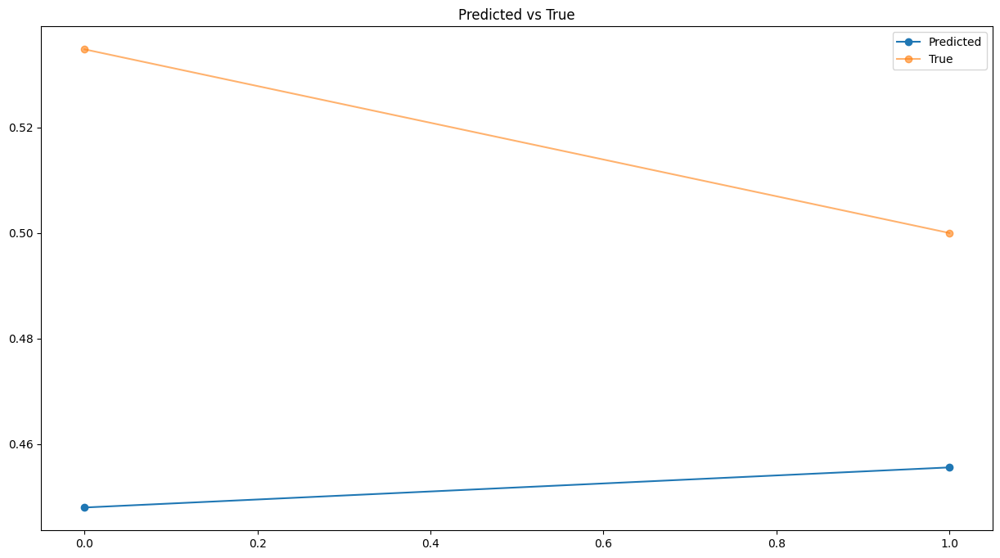

{'mae': 0.06558085498602495,
 'mse': 0.06891850973562486,
 'rmse': 0.004749760984179417}

In [92]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [93]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,246.086517,286.0
1,249.579071,270.0


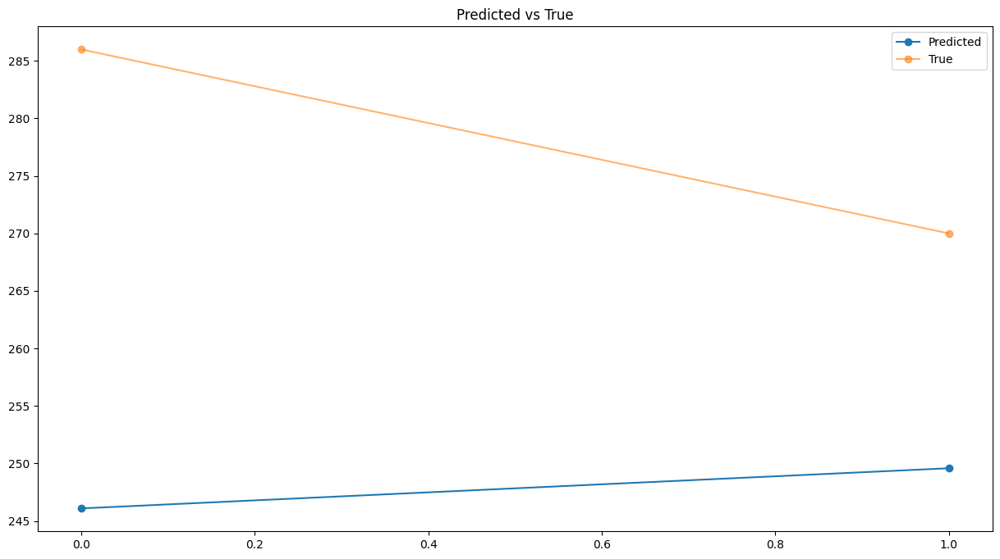

{'mae': 30.167205810546847,
 'mse': 31.70252701220106,
 'rmse': 1005.0502189593378}

In [94]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM sin dropout

In [95]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_NO_dropout.h5')

In [96]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [97]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 4ms/step


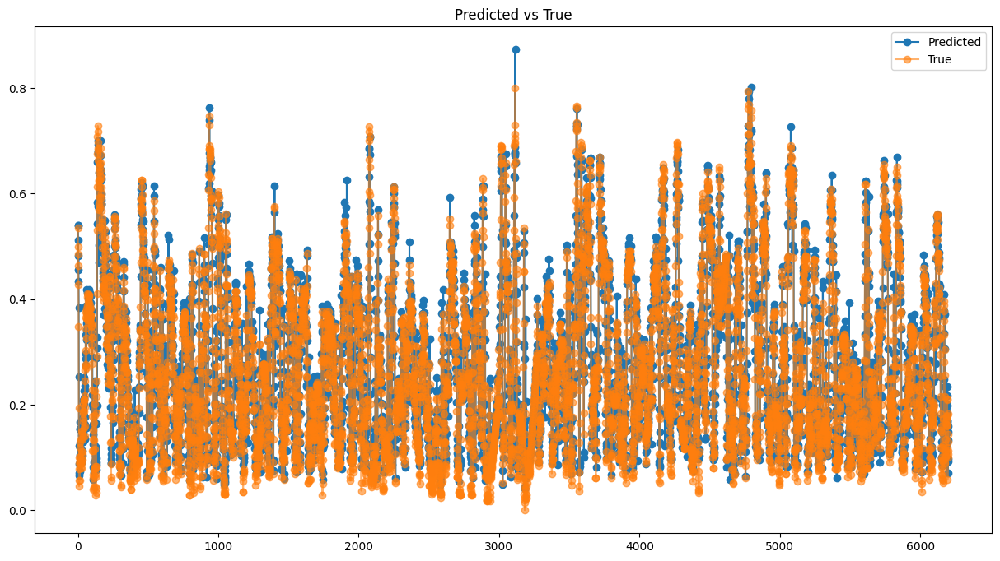

In [98]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [99]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03623874226794585,
 'mse': 0.050344502854013526,
 'rmse': 0.0025345689676177763}

In [100]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,288.048035
1,288.013123
2,275.048218
3,249.559082
4,262.071289
...,...
6196,82.517181
6197,113.496864
6198,101.293495
6199,84.997978


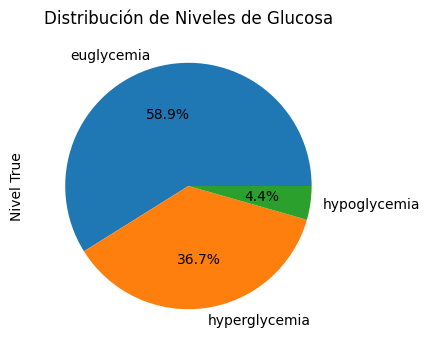

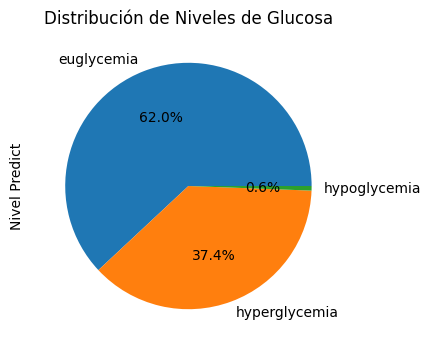

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,288.048035,hyperglycemia
1,270.0,hyperglycemia,288.013123,hyperglycemia
2,263.0,hyperglycemia,275.048218,hyperglycemia
3,253.0,hyperglycemia,249.559082,hyperglycemia
4,237.0,hyperglycemia,262.071289,hyperglycemia


In [101]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


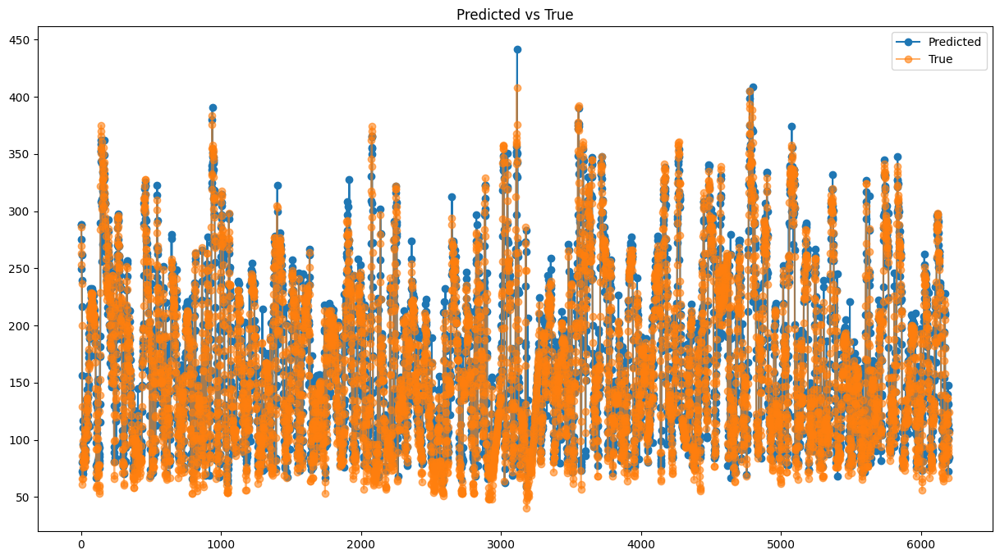

{'mae': 16.669821389162987,
 'mse': 23.158471312733823,
 'rmse': 536.3147935427155}

In [102]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [103]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [104]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,288.048035
2023-01-01 00:15:00,270.0,288.013123
2023-01-01 00:30:00,263.0,275.048218
2023-01-01 00:45:00,253.0,249.559082
2023-01-01 01:00:00,237.0,262.071289
...,...,...
2023-03-06 13:00:00,100.0,82.517181
2023-03-06 13:15:00,89.0,113.496864
2023-03-06 13:30:00,92.0,101.293495
2023-03-06 13:45:00,106.0,84.997978


AP, BE, EP: (0.8188709677419355, 0.11403225806451613, 0.06709677419354838)


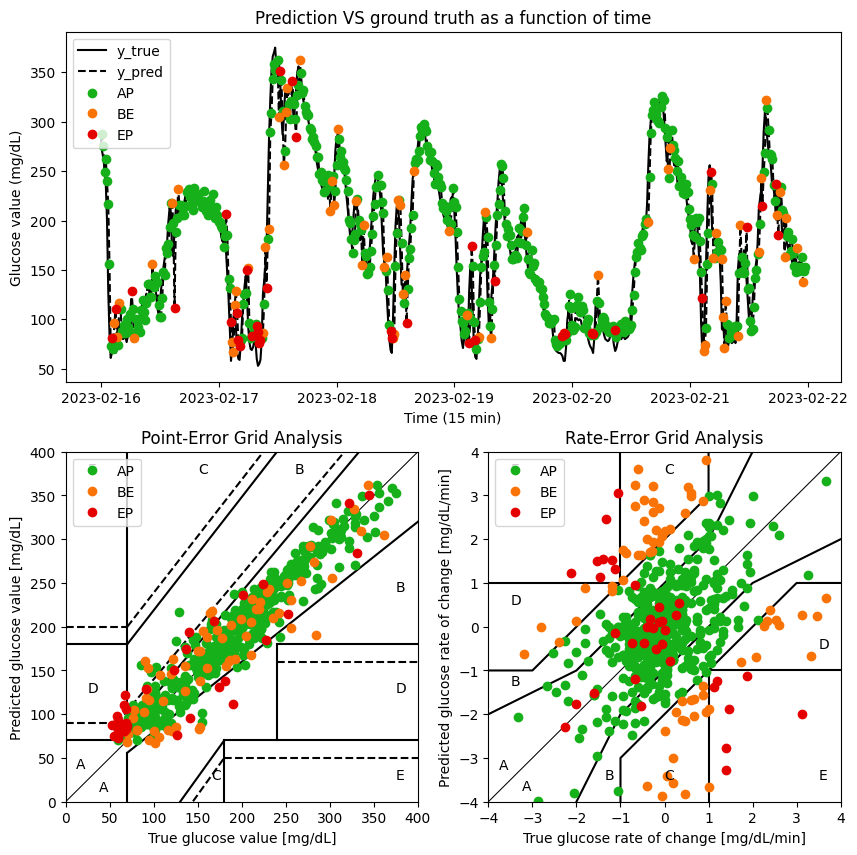

In [105]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [106]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,286.0,288.048035,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,270.0,288.013123,-1.066667,-0.002327,AP,A,B
2,2023-02-16 00:30:00,263.0,275.048218,-0.466667,-0.864327,AP,A,A
3,2023-02-16 00:45:00,253.0,249.559082,-0.666667,-1.699276,AP,A,B
4,2023-02-16 01:00:00,237.0,262.071289,-1.066667,0.834147,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-21 13:00:00,100.0,82.517181,0.933333,0.656000,AP,A,A
6197,2023-04-21 13:15:00,89.0,113.496864,-0.733333,2.065312,BE,B,uC
6198,2023-04-21 13:30:00,92.0,101.293495,0.200000,-0.813558,AP,A,B
6199,2023-04-21 13:45:00,106.0,84.997978,0.933333,-1.086368,BE,A,lC


# Predicción a 60 min del conjunto de pruebas generales

In [107]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [108]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 22ms/step


,Glucose level Predict,Glucose level True
0,0.539235,0.534783
1,0.539159,0.500000


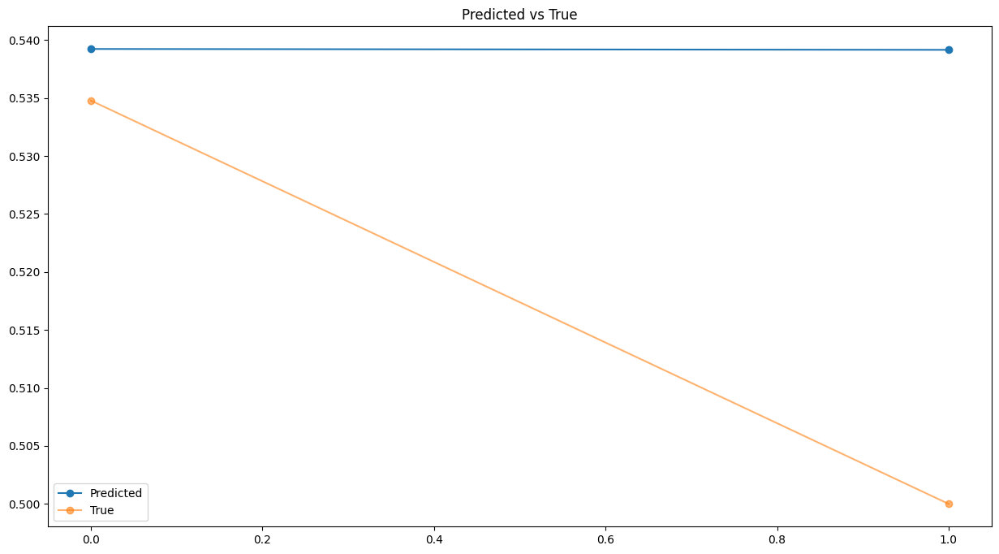

{'mae': 0.02180557432382002,
 'mse': 0.027867982551846533,
 'rmse': 0.0007766244515100228}

In [109]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [110]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,288.047974,286.0
1,288.013123,270.0


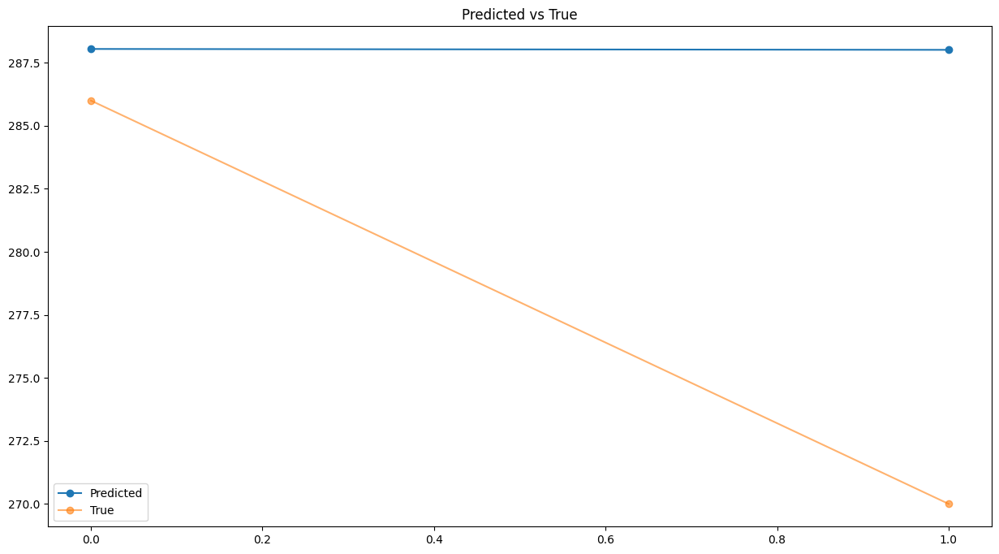

{'mae': 10.030548095703153,
 'mse': 12.819258564979808,
 'rmse': 164.33339015580816}

In [111]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)